# Procesamiento Digital de Imágenes Satelitales
# Instituto Gulich - Mayo - Julio 2025

---
#  Clase 08a: Aprendizaje no supervisado. Clustering
---
Lo que veremos en esta notebook:

- [x] Técnicas de clustering aplicadas a imágenes satelitales

Librerías a utilizar en esta notebook:

```python
import os

import numpy as np
import matplotlib
import matplotlib.pyplot as plt

import itertools

import rasterio
from rasterio.plot import show

import sys
sys.path.append('../')

from funciones import *
```

In [1]:
import os

import numpy as np
import matplotlib
import matplotlib.pyplot as plt

import itertools

import rasterio
from rasterio.plot import show

from funciones import *

# Abrir la imagen y prepararla para el _Clustering_

En el contexto de un problema de aprendizaje no supervisado, no contamos con datos etiquetados ni clases previamente establecidas, con lo cual ya no tendremos un _Y_ (etiquetas), sino solamente un _X_:

```python
path_proc = '../data/proc/'
path_out = '../data/out/'
raster_fn = os.path.join(path_proc, 'S2_dique_20181006.tif')

with rasterio.open(raster_fn) as src:
    img = src.read()
    crs = src.crs
    gt = src.transform
    
# Guardo los datos espectrales, descarto la info espacial.
d, x, y = img.shape
X = img.reshape([d, x*y]).T

print('Dimensiones del dataset X: ', X.shape)
```

In [2]:
path_proc = './proc/'
path_out = './out/'
raster_fn = os.path.join(path_proc, 'S2_dique_20181006.tif')

with rasterio.open(raster_fn) as src:
    img = src.read()
    crs = src.crs
    gt = src.transform
    
# Guardo los datos espectrales, descarto la info espacial.
d, x, y = img.shape
X = img.reshape([d, x*y]).T

print('Dimensiones del dataset X: ', X.shape)

Dimensiones del dataset X:  (1228800, 5)


# Aprendizaje no-supervisado $\rightarrow$ _Clustering_

### Veremos dos métodos de clustering:
1. El clásico [k-means](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)
1. Una generalización llamada [Gaussian Mixture Models](https://scikit-learn.org/stable/modules/generated/sklearn.mixture.GaussianMixture.html)

### Discutiremos brevemente el problema de la selección de modelos en este contexto

En general, casi todos los métodos de _clustering_ se importan de _sklearn.cluster_:

```python
from sklearn.cluster import KMeans
```

In [3]:
from sklearn.cluster import KMeans

### Breve descripción del algoritmo iterativo: 
1. a cada dato le asigno su centroide más cecano
1. calcular centroides promediando 

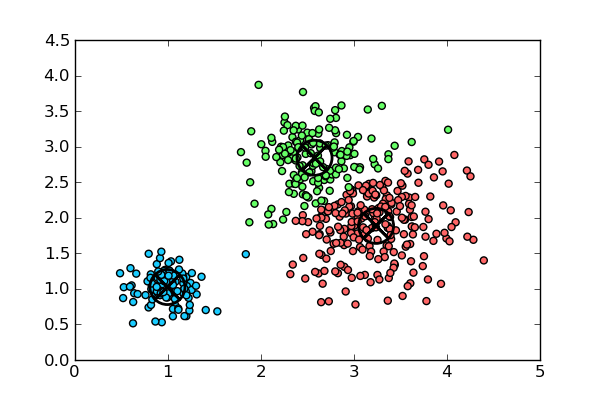

El siguiente [video](https://www.youtube.com/watch?v=5I3Ei69I40s) presenta de forma visual el funcionamiento del algoritmo.

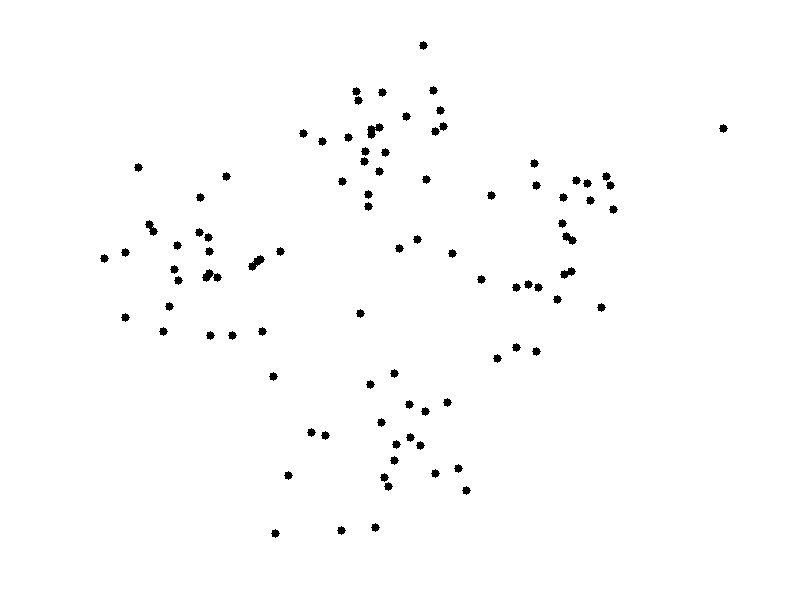


La forma de definir el método de _clustering_ y entrenarlo es la misma que usamos con los métodos de aprendizaje supervisado:

- Inicializar el objeto (en este caso, lo llamamos _kmeans_ con los hiper-parámetros con el cual queremos que corra. En este caso, uno de los más importantes el el número de _clusters_, `n_clusters`.
- Lo entrenamos con `.fit()` y en este caso lo hacemos solamente sobre X
- Con KMeans no es necesario hacer el paso de la  _predicción_  (`predict()`). El resultado (los datos etiquetados) se guardan en un atributo que tiene el objeto _kmeans_ que se llama `labels_`:

```python
# Defino el clustering
kmeans = KMeans(n_clusters=2, random_state=0, n_init=10)

# Lo corro sobre X
kmeans.fit(X)

# Imprimo las etiquetas que puso
kmeans.labels_
```

In [4]:
# Defino el clustering
kmeans = KMeans(n_clusters=2, random_state=0, n_init=10)

# Lo corro sobre X
kmeans.fit(X)

# Imprimo las etiquetas que puso
kmeans.labels_

array([1, 1, 1, ..., 1, 1, 1])

Si imprimo los valores únicos de estos `labels_`, veré que tengo dos valores, porque yo corrí el KMeans con `n_clusters=2`

```python
print(np.unique(kmeans.labels_))
```

In [5]:
print(np.unique(kmeans.labels_))

[0 1]


También podemos imprimir los centroides de cada uno de los clusters. Cada centroide tiene 5 dimensiones, porque nuestras bandas de entrada fueron 5:
```python
print(kmeans.cluster_centers_)

print('Dimensiones de los centroides: ', kmeans.cluster_centers_.shape)
```

In [6]:
print(kmeans.cluster_centers_)

print('Dimensiones de los centroides: ', kmeans.cluster_centers_.shape)

[[0.11756236 0.1076134  0.10839453 0.17601167 0.1923309 ]
 [0.09605964 0.09334172 0.06519096 0.29235512 0.62795055]]
Dimensiones de los centroides:  (2, 5)


Reordenar este conjunto de datos etiquetados como imagen es muy simple. Con `reshape` y las dimensiones originales de las imágenes (x e y) volvemos a la estructura matricial:

```python
L = kmeans.labels_
Yimg = L.reshape(x, y)
```

In [7]:
L = kmeans.labels_
Yimg = L.reshape(x, y)

Recorduerda que cuando ploteamos estos datos discretos con Matplotlib, por defecto aplica una rampa de colores continua. Una manera de discretizar los colores es definir explicitamente un mapa de colores con la cantidad de cortes que queremos (uno por cada clase). Eso lo hacemos con una función de Matplotlib que se llama `get_cmap`:

```python
cmap = plt.get_cmap('viridis', 2)
fig, ax = plt.subplots(figsize=(15, 8))
im = ax.imshow(Yimg, cmap=cmap)
cbar = fig.colorbar(im, ax=ax, ticks=[0.25, 0.75])
cbar.ax.set_yticklabels(['0', '1'])
plt.show()
```

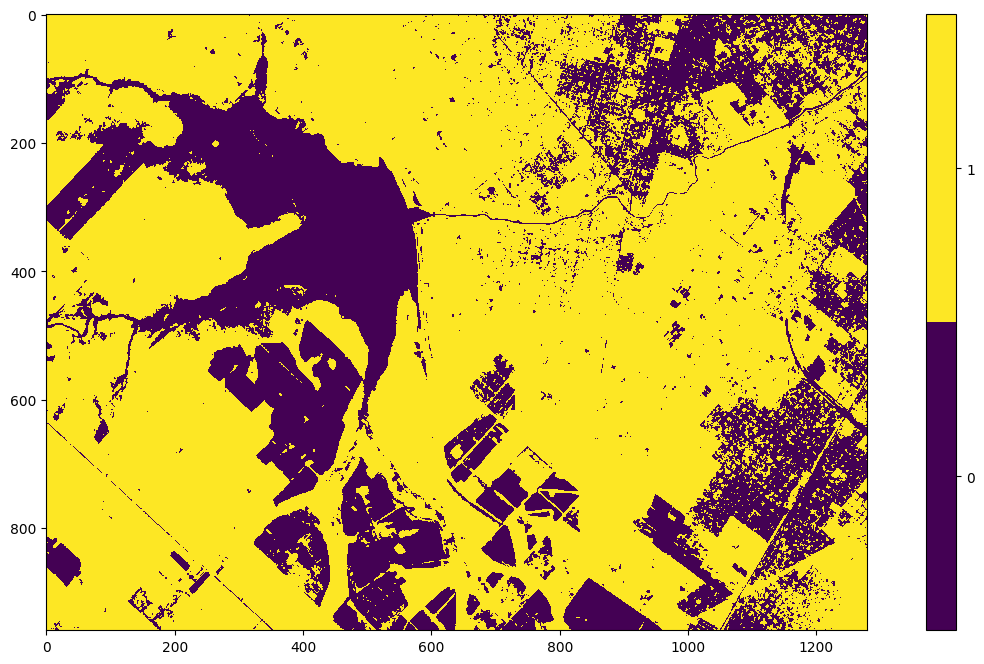

In [8]:
cmap = plt.get_cmap('viridis', 2)
fig, ax = plt.subplots(figsize=(15, 8))
im = ax.imshow(Yimg, cmap=cmap)
cbar = fig.colorbar(im, ax=ax, ticks=[0.25, 0.75])
cbar.ax.set_yticklabels(['0', '1'])
plt.show()

A continuación, podemos usar los _scatterplots_ para ver, de a pares de bandas), cómo nos quedaron etiquetados nuestros datos. Hacerlo para todos los píxeles de la imagen puede ser realmente muy demandante para nuestro equipo, con lo cual una estrategia es primero tomar una muestra aleatoria de nuestro _dataset_ X, con el siguiente bloque de código, donde _R_ va a contener los índices de una muestra de 1000 elementos (el tamaño lo definimos como _N_):

```python
N = 1000
R = np.random.randint(low=0, high=X.shape[0], size=N)
```

In [9]:
N = 1000
R = np.random.randint(low=0, high=X.shape[0], size=N)

Observar abajo cómo usamos el _R_ definido previamente. Si quisieras plotear todos los datos, tendrias que correr el código así:

```python
fig, ax = plt.subplots(figsize=(15, 8))
# Hago el ploteo. Lo hacemos utilizando todos los datos:
# ax.scatter(X[:, 2], X[:, 3], c=L, cmap='Spectral')
# Hago el ploteo de nuestros datos muestreados:
ax.scatter(X[R, 2], X[R, 3], c=L[R], cmap='Spectral')
ax.set_xlabel('RED')
ax.set_ylabel('NIR')
plt.show()
```

Sin embargo, a no ser que estés trabajando con un recorte, no te lo recomendamos

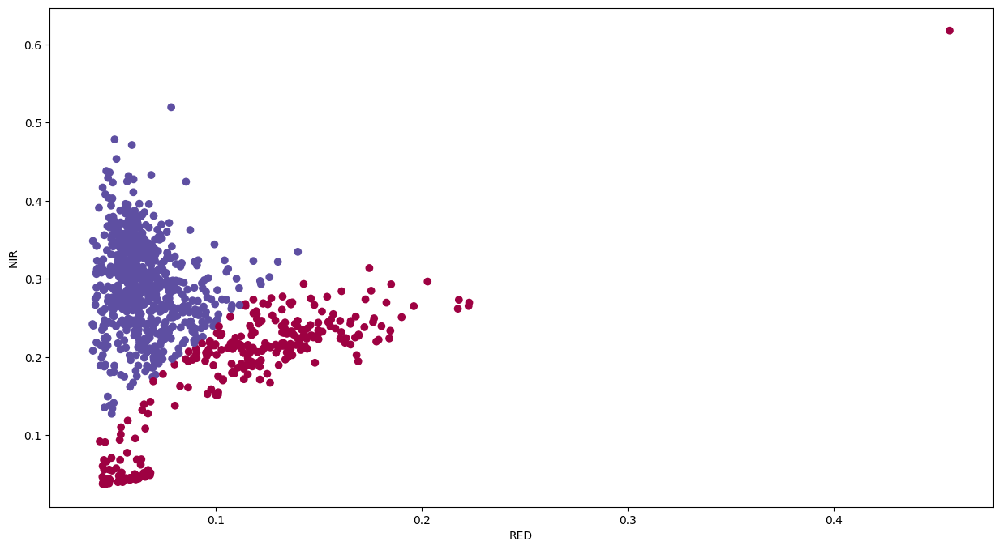

In [10]:
fig, ax = plt.subplots(figsize=(15, 8))
# Hago el ploteo. Lo hacemos utilizando todos los datos:
# ax.scatter(X[:, 2], X[:, 3], c=L, cmap='Spectral')
# Hago el ploteo de nuestros datos muestreados:
ax.scatter(X[R, 2], X[R, 3], c=L[R], cmap='Spectral')
ax.set_xlabel('RED')
ax.set_ylabel('NIR')
plt.show()

Probemos ahora correr el KMeans con 3 clusters, y veamos cómo queda nuestro mapa etiquetado con una salida un poco más elaborada:

```python
kmeans = KMeans(n_clusters=3, random_state=0, n_init=10)
kmeans.fit(X)
L = kmeans.labels_
Yimg = L.reshape([x, y])

# Graficamos nuestra salida
cmap = plt.get_cmap('viridis', 3)
fig, ax = plt.subplots(figsize=(15, 8))
ax.ticklabel_format(style='plain')
ax.text(336000, 6162400, u'\u25B2\nN', fontsize='xx-large', color='white')
ax.grid()
im = show(Yimg, cmap=cmap, ax=ax, transform=gt)
im = im.get_images()[0]
cbar = fig.colorbar(im, ax=ax, ticks=[1/3, 1, 5/3])
cbar.ax.set_yticklabels(['0', '1', '2'])

plt.table(cellText=[(0, 'Clase 1'), (1, 'Clase 2'), (2, 'Clase 3')],
          cellLoc='center',
          colLabels=['$\\bf{Cluster}$', '$\\bf{Clase}$'],
          colColours=['powderblue', 'powderblue'],
          colWidths=[0.1, 0.2],
          bbox=(1.2, 0.7, 0.3, 0.3))
plt.show()
```

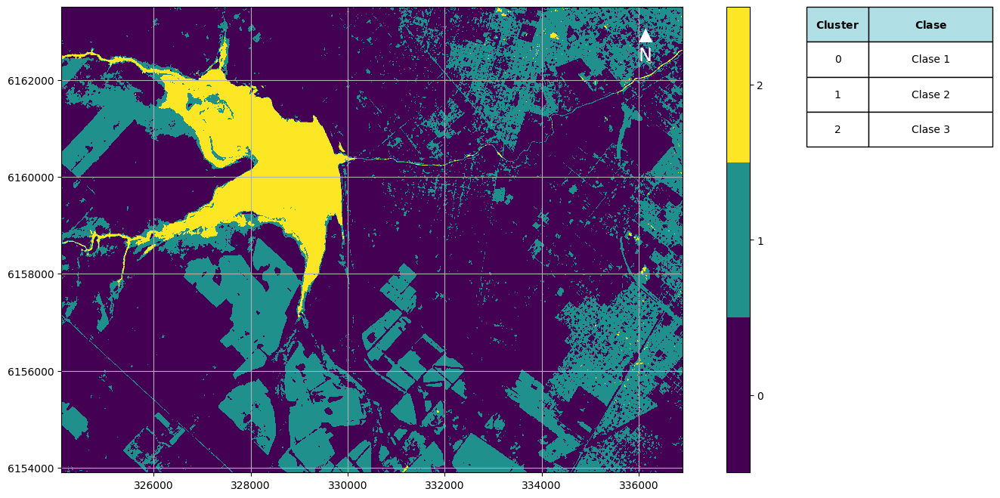

In [11]:
kmeans = KMeans(n_clusters=3, random_state=0, n_init=10)
kmeans.fit(X)
L = kmeans.labels_
Yimg = L.reshape([x, y])

# Graficamos nuestra salida
cmap = plt.get_cmap('viridis', 3)
fig, ax = plt.subplots(figsize=(15, 8))
ax.ticklabel_format(style='plain')
ax.text(336000, 6162400, u'\u25B2\nN', fontsize='xx-large', color='white')
ax.grid()
im = show(Yimg, cmap=cmap, ax=ax, transform=gt)
im = im.get_images()[0]
cbar = fig.colorbar(im, ax=ax, ticks=[1/3, 1, 5/3])
cbar.ax.set_yticklabels(['0', '1', '2'])

plt.table(cellText=[(0, 'Clase 1'), (1, 'Clase 2'), (2, 'Clase 3')],
          cellLoc='center',
          colLabels=['$\\bf{Cluster}$', '$\\bf{Clase}$'],
          colColours=['powderblue', 'powderblue'],
          colWidths=[0.1, 0.2],
          bbox=(1.2, 0.7, 0.3, 0.3))
plt.show()

Vuelvo a repetir el _Scatterplot_, de nuevo tomando una muestra de datos _R_:

```python
N = 1000
R = np.random.randint(low=0, high=X.shape[0], size=N)

fig, ax = plt.subplots(figsize=(15, 8))
# Hago el ploteo. Como queremos hacerlo solo sobre los elementos muestreados, le paso R como índice:
ax.scatter(X[R, 2], X[R, 3], c=L[R], cmap='Spectral')
ax.set_xlabel('RED')
ax.set_ylabel('NIR')
plt.show()
```

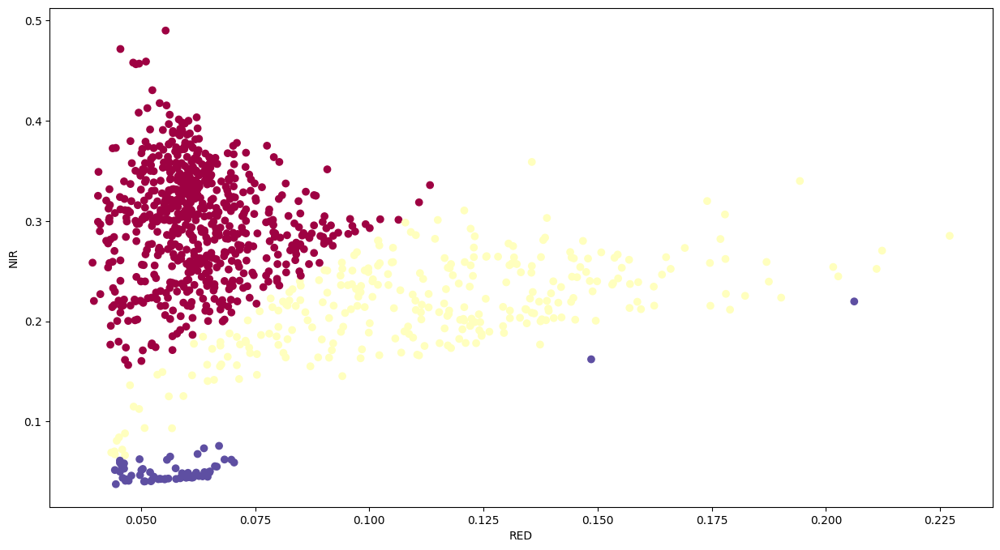

In [12]:
N = 1000
R = np.random.randint(low=0, high=X.shape[0], size=N)

fig, ax = plt.subplots(figsize=(15, 8))
# Hago el ploteo. Como queremos hacerlo solo sobre los elementos muestreados, le paso R como índice:
ax.scatter(X[R, 2], X[R, 3], c=L[R], cmap='Spectral')
ax.set_xlabel('RED')
ax.set_ylabel('NIR')
plt.show()

Veamos ahora con 4 clusters:
```python
kmeans = KMeans(n_clusters=4, random_state=0, n_init=10)
kmeans.fit(X)
L = kmeans.labels_
Yimg = L.reshape([x,y])

fig, ax = plt.subplots(figsize=(15, 10))
ax.imshow(Yimg)
plt.show()
```

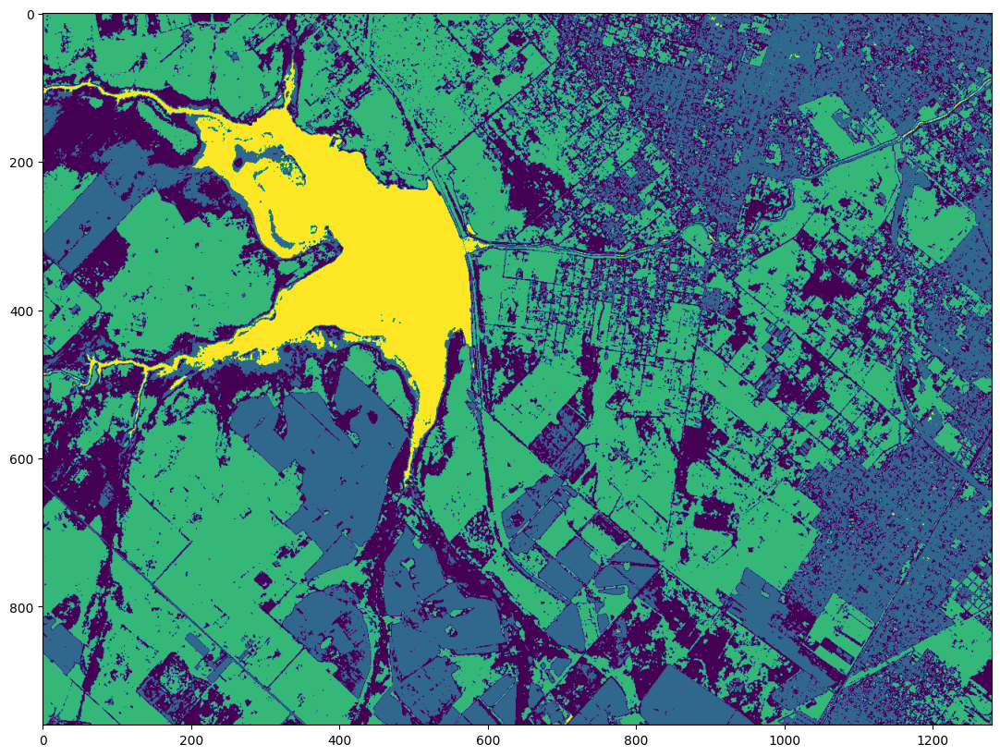

In [13]:
kmeans = KMeans(n_clusters=4, random_state=0, n_init=10)
kmeans.fit(X)
L = kmeans.labels_
Yimg = L.reshape([x,y])

fig, ax = plt.subplots(figsize=(15, 10))
ax.imshow(Yimg)
plt.show()

```python
N = 1000
R = np.random.randint(low=0, high=X.shape[0],size=N)

fig, ax = plt.subplots(figsize=(15, 10))
# Hago el ploteo. Como queremos hacerlo solo sobre los elementos muestreados, le paso R como índice:
ax.scatter(X[R, 2], X[R, 3], c=L[R], cmap='Spectral')
ax.set_xlabel('RED')
ax.set_ylabel('NIR')
plt.show()
```

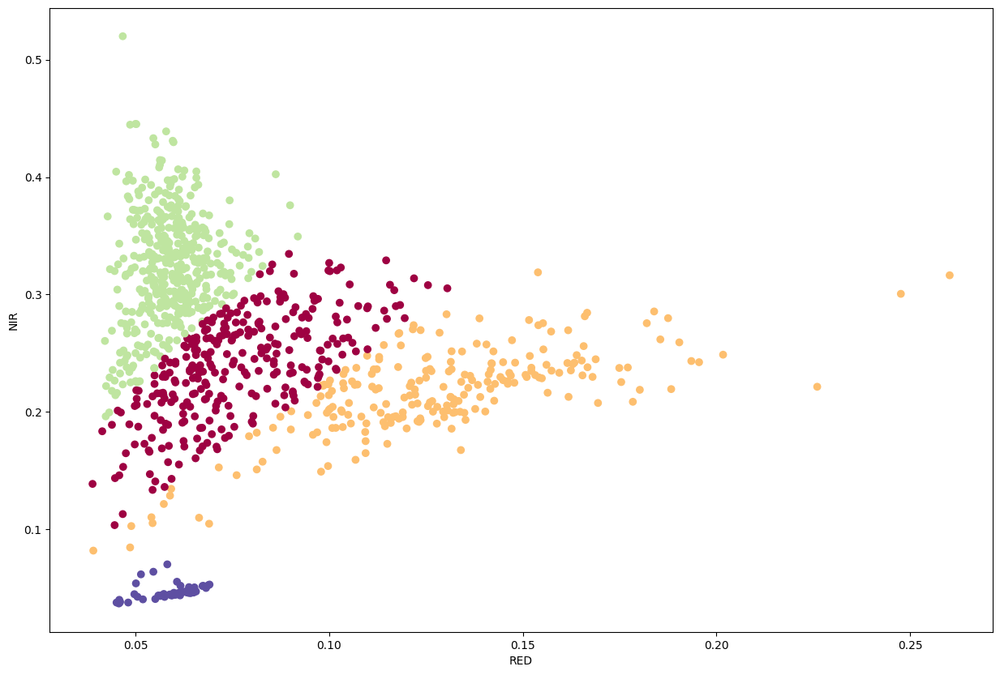

In [14]:
N = 1000
R = np.random.randint(low=0, high=X.shape[0],size=N)

fig, ax = plt.subplots(figsize=(15, 10))
# Hago el ploteo. Como queremos hacerlo solo sobre los elementos muestreados, le paso R como índice:
ax.scatter(X[R, 2], X[R, 3], c=L[R], cmap='Spectral')
ax.set_xlabel('RED')
ax.set_ylabel('NIR')
plt.show()

Y ahora con 5 _clusters_:

```python
kmeans = KMeans(n_clusters=5, random_state=0, n_init=10)
kmeans.fit(X)
L = kmeans.labels_

Yimg = L.reshape([x, y])

fig, ax = plt.subplots(figsize=(15, 10))
ax.imshow(Yimg)
plt.show()
```

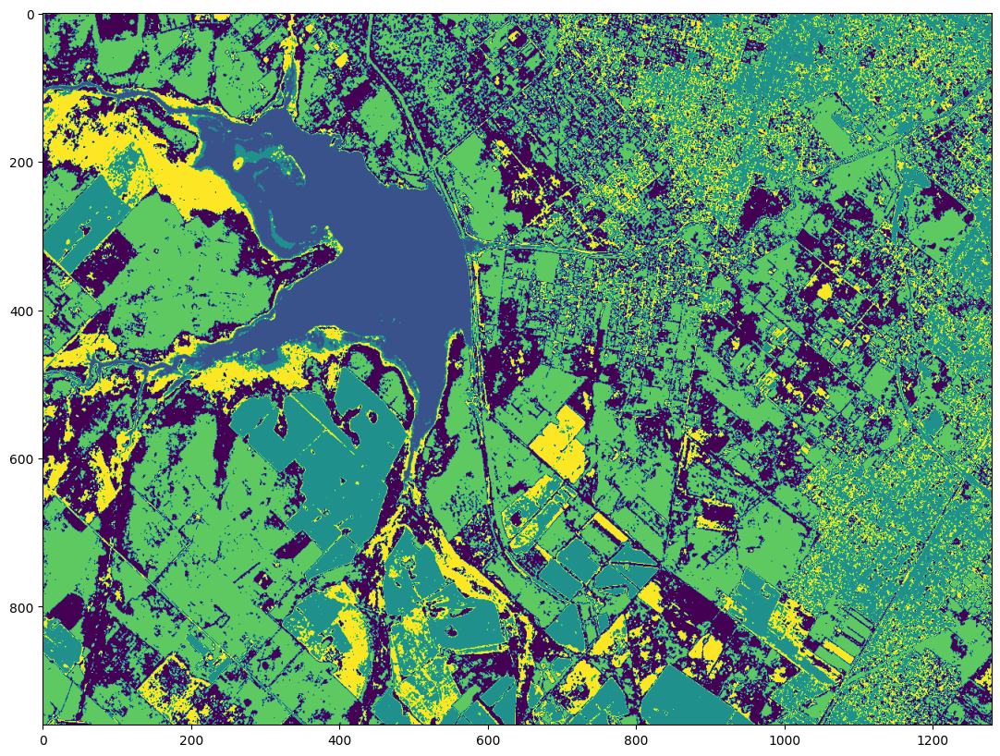

In [15]:
kmeans = KMeans(n_clusters=5, random_state=0, n_init=10)
kmeans.fit(X)
L = kmeans.labels_

Yimg = L.reshape([x, y])

fig, ax = plt.subplots(figsize=(15, 10))
ax.imshow(Yimg)
plt.show()

```python
N = 1000
R = np.random.randint(low=0, high=X.shape[0],size=N)

fig, ax = plt.subplots(figsize=(15, 10))
# Hago el ploteo. Como queremos hacerlo solo sobre los elementos muestreados, le paso R como índice:
ax.scatter(X[R, 2], X[R, 3], c=L[R], cmap='Spectral')
ax.set_xlabel('RED')
ax.set_ylabel('NIR')
plt.show()

```

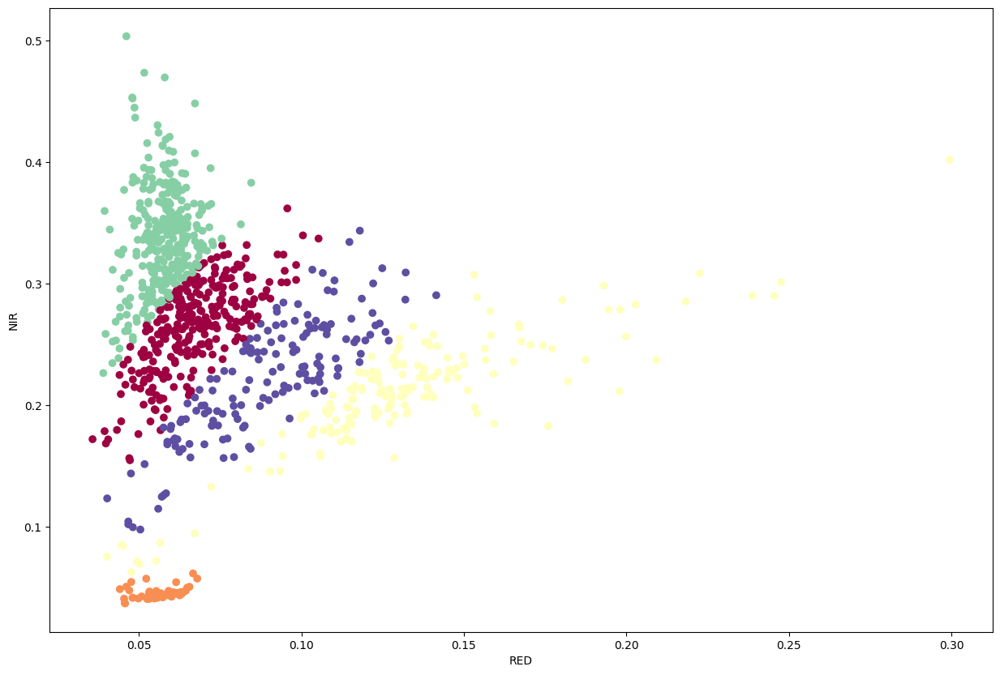

In [16]:
N = 1000
R = np.random.randint(low=0, high=X.shape[0],size=N)

fig, ax = plt.subplots(figsize=(15, 10))
# Hago el ploteo. Como queremos hacerlo solo sobre los elementos muestreados, le paso R como índice:
ax.scatter(X[R, 2], X[R, 3], c=L[R], cmap='Spectral')
ax.set_xlabel('RED')
ax.set_ylabel('NIR')
plt.show()

Podríamos iniciar a explorar la cantidad de cluster ideales aplicando el método del codo visto anteriormente:
```python
sse = {}
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, random_state=0).fit(X)
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()
```

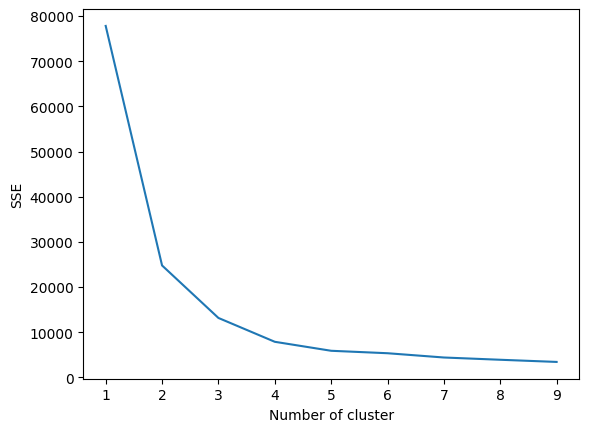

In [17]:
sse = {}
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, random_state=0).fit(X)
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

Puedes seguir jugando con otra cantidad de K-medias, o con los resultados ya obtenidos cambiar el par de bandas que ploteamos para ver cómo impactó la clasificación sobre nuestros datos.

## Limitaciones de K-means

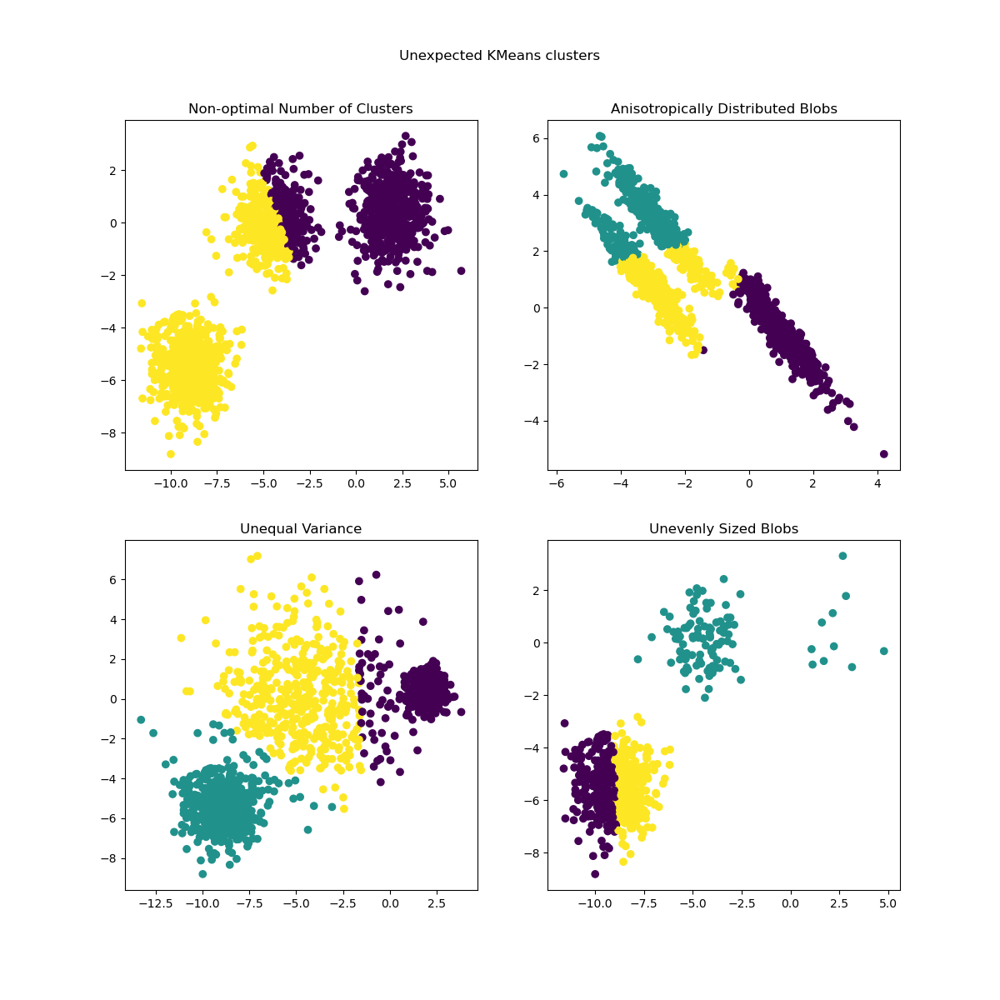
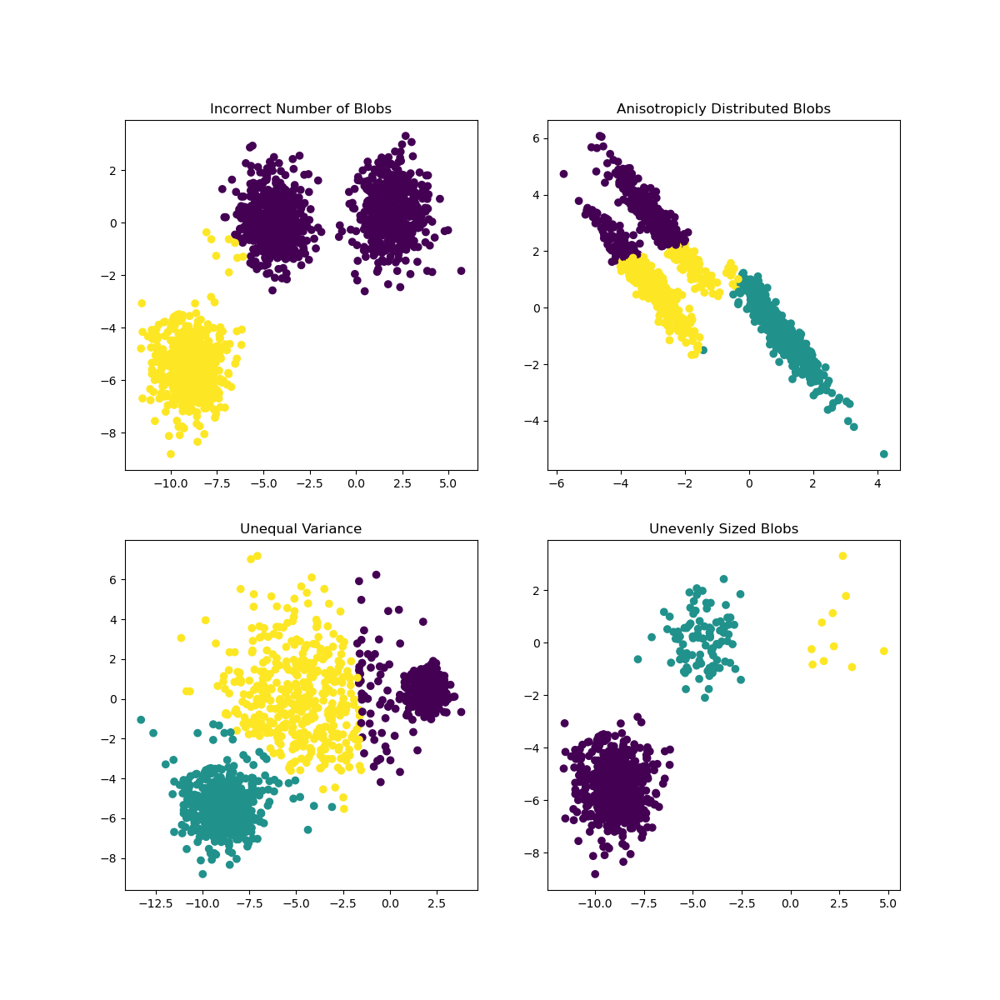

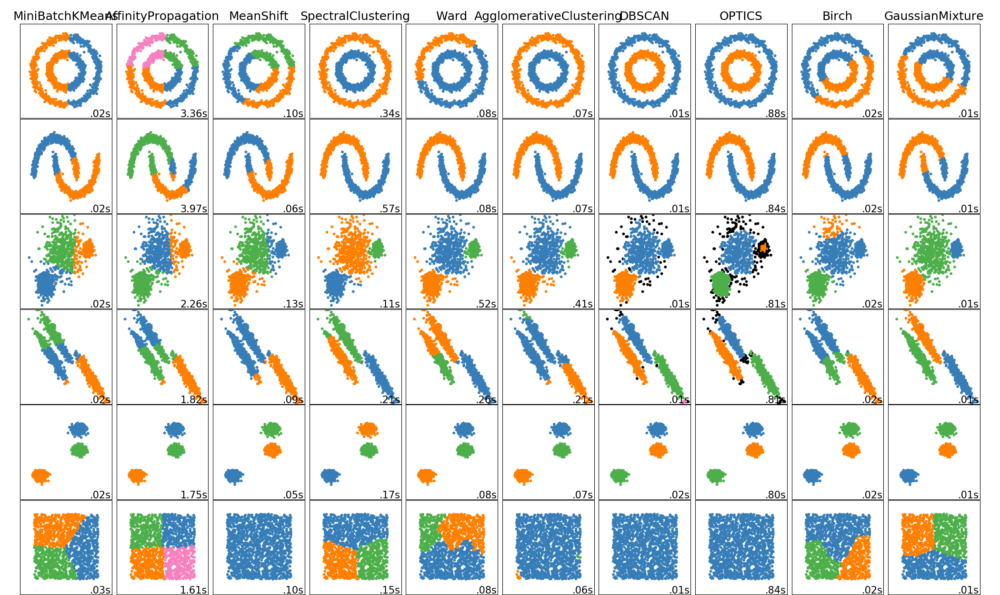

# Modelos de mezcla de Gaussianas

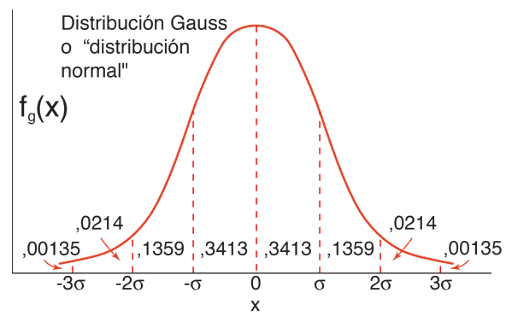

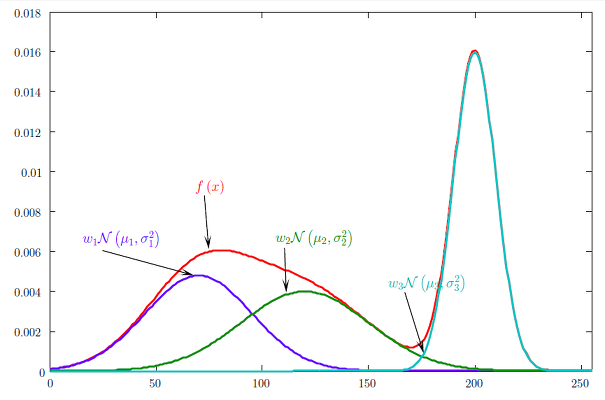

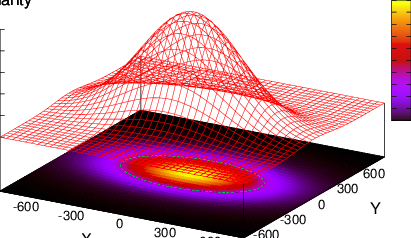

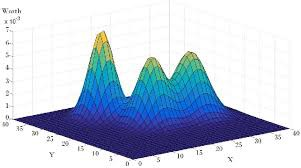

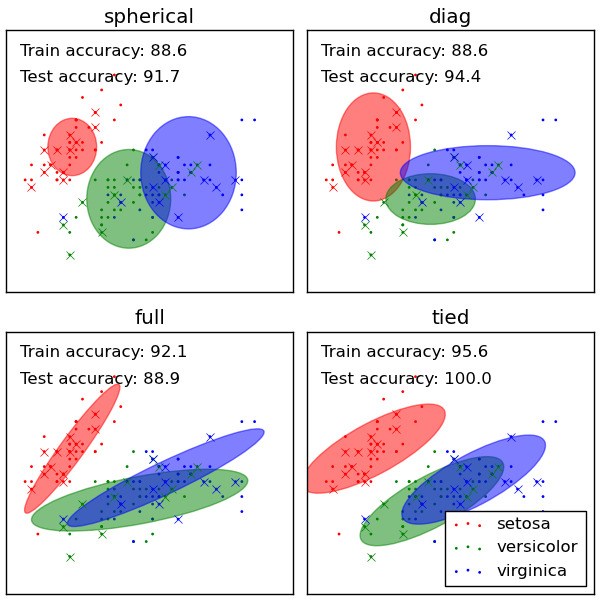

Ahora vamos a ir por [Mezcla de Gaussianas](https://scikit-learn.org/stable/modules/generated/sklearn.mixture.GaussianMixture.html) (o por sus siglas en inglés, _GMM_). Dentro de Scikit-Learn, encontramos a la mezcla de gaussianas dentro del módulo _mixture_. Aquí los parámetros más importantes que debemos definir son:

- El número de componentes, que terminará siendo el número de clusters.
- Qué estructura asumiremos para la matriz de covarianza. El valor por defecto es siempre _full_

```python
# Probamos con 6 componentes:
from sklearn import mixture

gmm = mixture.GaussianMixture(n_components=6, covariance_type='full')
gmm.fit(X)
```

In [18]:
from sklearn import mixture

gmm = mixture.GaussianMixture(n_components=6, covariance_type='full')
gmm.fit(X)

GaussianMixture(n_components=6)

Como GMM no es estrictamente un método de _clustering_ dentro de Scikit-Learn, sí es necesario usar el método _predict()_ sobre X para obtener el resultado de la clasificación. Para pasarlo a imagen, usamos como siempre el _reshape_:

```python
Y_pred = gmm.predict(X)
Yimg = Y_pred.reshape([x, y])
```

In [19]:
Y_pred = gmm.predict(X)
Yimg = Y_pred.reshape([x, y])

```python
cmap = plt.get_cmap('Spectral', 6)
fig, ax = plt.subplots(figsize=(15, 10))
ax.imshow(Yimg, cmap=cmap)
plt.show()
```

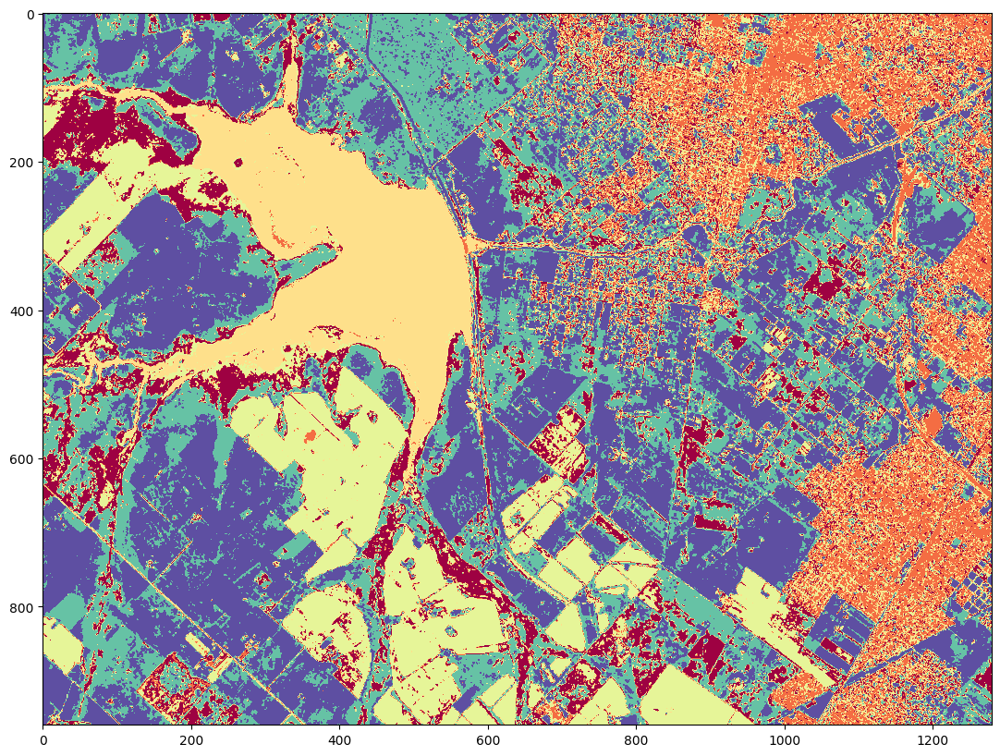

In [20]:
cmap = plt.get_cmap('Spectral', 6)
fig, ax = plt.subplots(figsize=(15, 10))
ax.imshow(Yimg, cmap=cmap)
plt.show()

Podemos guardar esta clasificación con la función **guardar_GTiff**, ya que hemos leido previamente los parámetros que necesitamos de la imagen como el _transform_ y el _crs_:
```python
guardar_GTiff(os.path.join(path_out, 'Dique_Clust_GMM6_IMG.tif'), crs, gt, Yimg)
```

In [21]:
guardar_GTiff(os.path.join(path_out, 'Dique_Clust_GMM6_IMG.tif'), crs, gt, Yimg)

# Selección de modelos
Navaja de Ockham: *en igualdad de condiciones, la explicación más simple suele ser la más probable*

## El criterio de información bayesiano (BIC)

El criterio de información bayesiano (BIC) permite comparar y seleccionar entre modelos. Se basa, en la función de verosimilitud de un modelo y está relacionado con el Criterio de Información de Akaike (AIC).

Al usar modelos, es posible mejor el ajuste usando modelos más complejos, con más parámetros, pero está el riesgo de llegar a un sobreajuste. Tanto el BIC y AIC apuntan a encontrar un equilibrio mediante la introducción de un término de penalización para el número de parámetros en el modelo.

El BIC se define formalmente como:

### BIC = k$\cdot$ln(n) - 2$\cdot$ln(L).


donde 

- L es el valor de verosimilitud del modelo;
- n = el número de datos u observaciones ;
- k = el número de parámetros libres a ser estimados en el modelo.


Vamos a apoyarnos en el BIC para intentar tomar alguna decisión sobre qué cuál es la combinación de hiper-parámetros que nos da la mezcla de gaussianas más adecuada para nuestros datos.

Lo que hace la siguiente celda es probar distintas combinaciones de los parámetros `n_components` y `covariance_type`. Va corriendo un GMM con cada combinación, y calculando el BIC que se va almacenando en una lista que se inicializa vacia y se llama `bic`.

¿Cómo se asegura de elegir el modelo que da el BIC más bajo?:

- Inicializa una variable que se llama `lowest_bic` con el valor infinito
- En cada iteración, calcula el BIC del modelo corrido, lo compara con `lowest_bic` y si es menor, ese BIC calculado pasa a ser el lowest BIC. Si se cumple esa condición, el mejor modelo `best_gmm` pasa a ser el de la corrida actual.
- Hay un doble ciclo _for_, un nivel va iterando por el modelo de covarianza, y el otro por el numero de componentes. 

Nuestro conjunto de datos es muy grande, con lo cual la grilla de búsqueda de parámetros que usamos es pequeña. Sobre un recorte o un dataset menos pesado, podríamos hacer una búsqueda sobre más valores.

```python
# Inicializo lowest_bic como infinito
lowest_bic = np.inf

# Creo una lista vacía para guardar mis BIC
bic = []

# Defino los valores de los parámetros con los que voy a experimentar
n_components_range = [5, 40, 75]
cv_types = ['spherical', 'full']  # covarianzas


print('BIC for different models')

# Inicio el ciclo FOR:
for cv_type in cv_types:  # cv_type: Spherical o Full
    for n_components in n_components_range:  # n_components :5, 40, 75
        # ajustá un Gaussian mixture 
        print(cv_type, n_components, end=': ')  # Qué efecto tiene el parámetro end?
        gmm = mixture.GaussianMixture(n_components=n_components,
                                      covariance_type=cv_type)
        gmm.fit(X)
        # Calculo el BIC del modelo actual
        gmmbic = gmm.bic(X)
        print(gmmbic)
        # Agrego el BIC a la lista con append
        bic.append(gmmbic)
        
        # se queda con el mejor bic y recuerda el mejor modelo también
        if bic[-1] < lowest_bic:
            lowest_bic = bic[-1]
            best_gmm = gmm

# Convierto la lista a array
bic = np.array(bic)

# En la variable clf pongo lo que tengo en best_gmm
clf = best_gmm

```

In [22]:
# Inicializo lowest_bic como infinito
lowest_bic = np.inf

# Creo una lista vacía para guardar mis BIC
bic = []

# Defino los valores de los parámetros con los que voy a experimentar
n_components_range = [5, 40, 75]
cv_types = ['spherical', 'full']  # covarianzas


print('BIC for different models')

# Inicio el ciclo FOR:
for cv_type in cv_types:  # cv_type: Spherical o Full
    for n_components in n_components_range:  # n_components :5, 40, 75
        # ajustá un Gaussian mixture 
        print(cv_type, n_components, end=': ')  # Qué efecto tiene el parámetro end?
        gmm = mixture.GaussianMixture(n_components=n_components,
                                      covariance_type=cv_type)
        gmm.fit(X)
        # Calculo el BIC del modelo actual
        gmmbic = gmm.bic(X)
        print(gmmbic)
        # Agrego el BIC a la lista con append
        bic.append(gmmbic)
        
        # se queda con el mejor bic y recuerda el mejor modelo también
        if bic[-1] < lowest_bic:
            lowest_bic = bic[-1]
            best_gmm = gmm

# Convierto la lista a array
bic = np.array(bic)

# En la variable clf pongo lo que tengo en best_gmm
clf = best_gmm

BIC for different models
spherical 5: -22617676.57907608
spherical 40: -30240208.35219182
spherical 75: -32363117.52202452
full 5: -39662919.466478154
full 40: -42698643.55193778
full 75: -42903929.99435398


Nuestra lista `bic` tiene 6 valores, correspondientes a las 6 combinaciones probadas:

```python
print(bic)
```

In [23]:
print(bic)

[-22617676.57907608 -30240208.35219182 -32363117.52202452
 -39662919.46647815 -42698643.55193778 -42903929.99435398]


```python
print('Valor de BIC más bajo:', lowest_bic)
```

In [24]:
print('Valor de BIC más bajo:', lowest_bic)

Valor de BIC más bajo: -42903929.99435398


La siguiente celda plotea los BIC encontrados según el número de componentes y el modelo de varianza asumido:

```python
color_iter = itertools.cycle(['navy', 'turquoise', 'cornflowerblue',
                              'darkorange'])
bars = []
# Plot the BIC scores
fig, spl = plt.subplots(figsize=(8, 6))

for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range) + .2*(i - 2)
    bars.append(plt.bar(xpos, bic[i * len(n_components_range):
                                  (i + 1) * len(n_components_range)],
                        width=.2, color=color))
plt.xticks(n_components_range)
plt.title('BIC score per model')
spl.set_xlabel('Number of components')
spl.legend([b[0] for b in bars], cv_types, bbox_to_anchor=(1.2, 1))
plt.show()
```

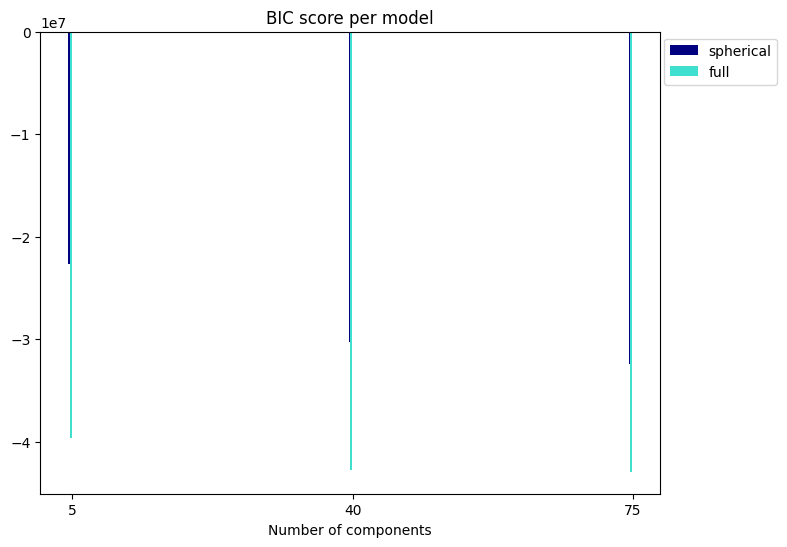

In [25]:
color_iter = itertools.cycle(['navy', 'turquoise', 'cornflowerblue',
                              'darkorange'])
bars = []
# Plot the BIC scores
fig, spl = plt.subplots(figsize=(8, 6))

for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range) + .2*(i - 2)
    bars.append(plt.bar(xpos, bic[i * len(n_components_range):
                                  (i + 1) * len(n_components_range)],
                        width=.2, color=color))
plt.xticks(n_components_range)
plt.title('BIC score per model')
spl.set_xlabel('Number of components')
spl.legend([b[0] for b in bars], cv_types, bbox_to_anchor=(1.2, 1))
plt.show()

El gráfico anterior indica que para mejorar el BIC tendríamos que probar con un número aún mayor de componentes, dada la complejidad de nuestros datos. Veremos en la proxima Notebook que, al simplicar nuestros datos en segmentos, podremos hacer corridas para un rango de valores más amplio, y hacer un análisis más detallado de cuál es el valor adecuado de componentes a emplear.

Finalmente, ploteamos el mapa clasificado, y lo guardamos. En QGIS será más fácil tratar de interpretar cómo asignó las clases (recuerda que nos quedaron 75!!!)

```python
print(clf)

# Plot the winner
Y_pred = clf.predict(X)
Yimg = Y_pred.reshape([x, y])

fig, ax = plt.subplots(figsize=(15, 10))
ax.imshow(Yimg, cmap='jet')
plt.show()

guardar_GTiff(path_out + 'Dique_Clust_GMMWin_IMG.tif', crs, gt, Yimg)
```

GaussianMixture(n_components=75)


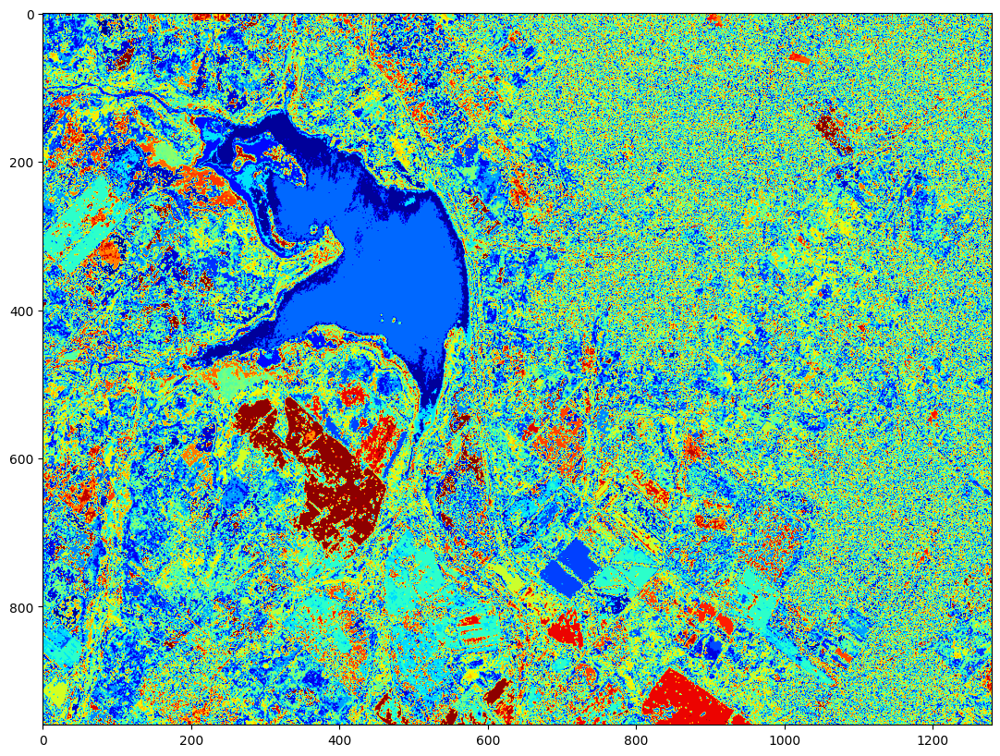

In [26]:
print(clf)

# Plot the winner
Y_pred = clf.predict(X)
Yimg = Y_pred.reshape([x, y])

fig, ax = plt.subplots(figsize=(15, 10))
ax.imshow(Yimg, cmap='jet')
plt.show()

guardar_GTiff(path_out + 'Dique_Clust_GMMWin_IMG.tif', crs, gt, Yimg)

```python
N = 10000
R = np.random.randint(low=0, high=X.shape[0], size=N)

fig, ax = plt.subplots(figsize=(15, 10))
# Hago el ploteo. Como queremos hacerlo solo sobre los elementos muestreados, le paso R como índice:
ax.scatter(X[R, 2], X[R, 3], c=Y_pred[R], cmap='Spectral')
ax.set_xlabel('RED')
ax.set_ylabel('NIR')
plt.show()
```

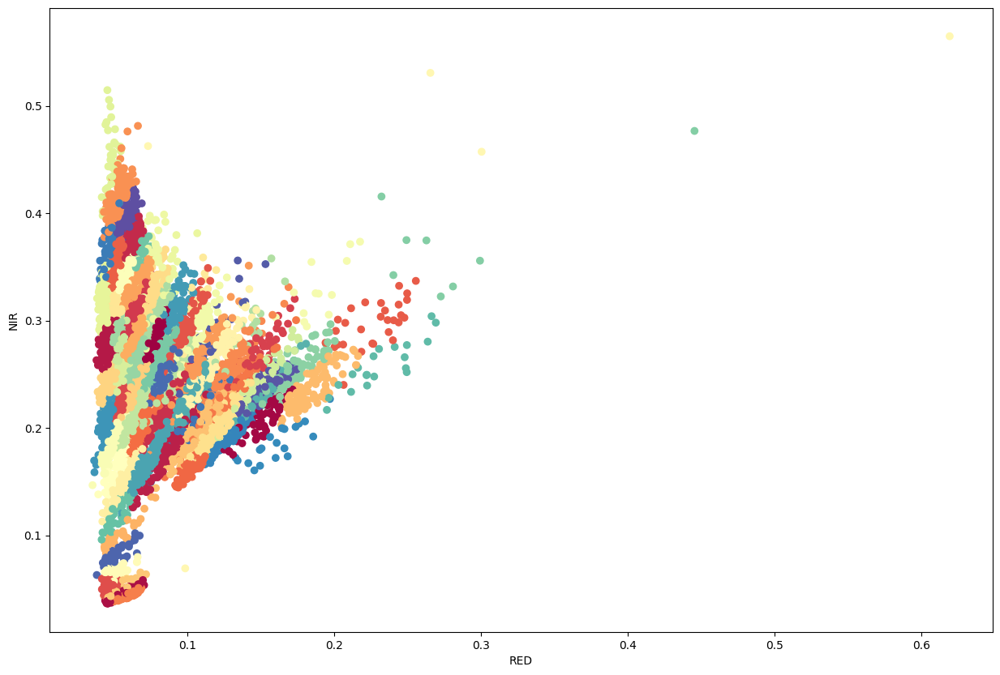

In [27]:
N = 10000
R = np.random.randint(low=0, high=X.shape[0], size=N)

fig, ax = plt.subplots(figsize=(15, 10))
# Hago el ploteo. Como queremos hacerlo solo sobre los elementos muestreados, le paso R como índice:
ax.scatter(X[R, 2], X[R, 3], c=Y_pred[R], cmap='Spectral')
ax.set_xlabel('RED')
ax.set_ylabel('NIR')
plt.show()

### Ejercicio 11.1 Usando el BIC (opcional)

Usando el rectore `clip = img[:, 200:400, 200:400]` de la imagen levantada antes, correr un gmm con 10, 20, 30, 40, 50 y 60 clases con el modelo esférico y le modelo completo. Comparar los resultados a partir del BIC. Seleccionar el mejor clustering, visualizar los resultados y guardarlo como geotiff.

Si queremos guardar el recorte, tenemos que re-refinir el Transform (`gt`):

```python
print('Transform original: ', gt)
```

Algo muy útil que tiene el _transform_ de Rasterio, es que es una matriz que podemos hacer operar con otros números o matrices. Por ejemplo, si multiplicamos a _gt_ por el corrimiento que hicimos en filas y columnas para hacer nuestro recorte (200 filas, 200 columnas), obtenemos las coordenadas de nuestra nueva esquina superior izquierda:

```python
print('Coordenadas nuevas: ', gt*[200,200])
```

Podemos usar el método `translation()` de Rasterio, lo cual nos devuelve otra matriz que representa la traslación en X e Y:

```python
gt.translation(200, 200)
```

Multiplicando nuestro _transform_ original por esta traslación, podemos obtener la nueva geo-transformación que necesitamos para el recorte:

```python
gt_clip = gt*gt.translation(200, 200)
print(gt_clip)
```